In [ ]:
!unzip DataIMIPtransparent.zip
!unzip archive.zip

In [ ]:
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import models
import torch.nn as nn
import torch.optim as optim
import os
from PIL import Image, ImageFilter
import numpy as np
import matplotlib.pyplot as plt
import random

# Background addition

In [ ]:
def paste_foreground(img_foreground, img_background, blur_radius=.01):
    # Resize both images to 512x512
    foreground_resized = img_foreground.resize((512, 512), resample=Image.BILINEAR)
    background_resized = img_background.resize((512, 512), resample=Image.BILINEAR)

    # Create a composite image by pasting the foreground onto the background
    composite = Image.composite(foreground_resized, background_resized, foreground_resized)

    return composite

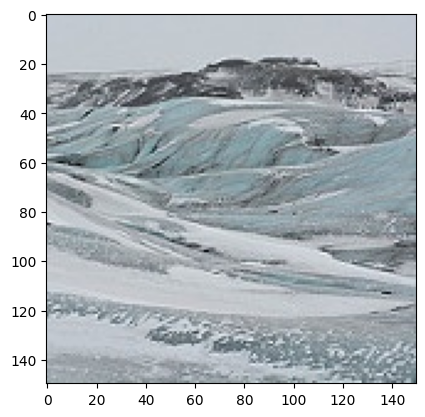

In [ ]:
background = Image.open('/content/data/20418.jpg')
plt.imshow(background)

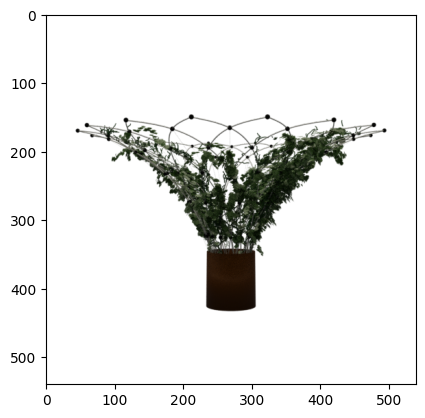

In [ ]:
foreground = Image.open('/content/Animation Blender IMIP 2/0150.png')
plt.imshow(foreground)

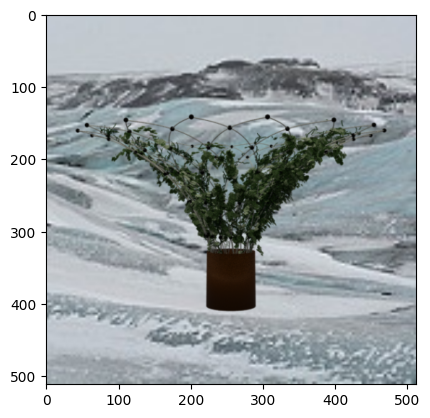

In [ ]:
result = paste_foreground(foreground, background)
plt.imshow(result)

In [ ]:
def process_images(foreground_folder, background_folder, dataset_folder, num_backgrounds=3):
    # Create the dataset folder if it doesn't exist
    if not os.path.exists(dataset_folder):
        os.makedirs(dataset_folder)

    # Iterate over foreground images
    for fg_file in os.listdir(foreground_folder):
        fg_path = os.path.join(foreground_folder, fg_file)
        if os.path.isfile(fg_path):
            # Open the foreground image
            fg_img = Image.open(fg_path)

            # List background files and shuffle them for randomness
            background_files = os.listdir(background_folder)
            random.shuffle(background_files)

            # Iterate over background images
            for i, bg_file in enumerate(background_files):
                if i >= num_backgrounds:
                    break  # Limit the number of background images per foreground
                bg_path = os.path.join(background_folder, bg_file)
                if os.path.isfile(bg_path):
                    # Open the background image
                    bg_img = Image.open(bg_path)

                    # Paste foreground onto background
                    result = paste_foreground(fg_img, bg_img)

                    # Save the result with filename same as foreground + background index
                    result_file = f"{os.path.splitext(fg_file)[0]}_{i}.png"
                    result_path = os.path.join(dataset_folder, result_file)
                    result.save(result_path)

In [ ]:
# 2 minute run with 3 background per image
process_images("/content/Animation Blender IMIP 2", "/content/data", "/content/train")

# Train on artificial data

In [ ]:
!unzip train.zip

In [ ]:
size = 256

In [ ]:
# Define a custom dataset class with transformations
class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = os.listdir(root_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')

        if self.transform:
            image = self.transform(image)

        # Extract label from the filename without extension and background number
        label = int(os.path.splitext(self.image_files[idx])[0][:4])

        return image, label


# Define transformation for the images (including data augmentation)
transform = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.2),
    transforms.RandomPerspective(distortion_scale=0.3, p=0.25),  # Random perspective transformation
    transforms.RandomRotation(degrees=15),  # Random rotation
    transforms.RandomResizedCrop(size, scale=(0.8,1.2), interpolation=transforms.InterpolationMode.BILINEAR),
    #transforms.RandomErasing(p=0.5, scale=(0.02, 0.2), ratio=(0.3, 3.3)),  # Random erasing
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])


# Create custom dataset instance
dataset = CustomDataset(root_dir='/content/train', transform=transform)

# Split the dataset into training and testing sets
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [ ]:
# Load pre-trained ResNet model
model = models.resnet18(pretrained=True)

# Modify the final fully connected layer for regression
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 1)  # Output one regression value

# Move model to GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Function to train the model
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=30):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets.float().view(-1, 1))
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_loss = running_loss / len(val_loader.dataset)

        if (epoch+1)%5 == 0:
          print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {epoch_loss}")

          # Evaluate the model
          evaluate_model(model, criterion, val_loader)

# Function to evaluate the model
def evaluate_model(model, criterion, val_loader):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets.float().view(-1, 1))
            running_loss += loss.item() * inputs.size(0)
    test_loss = running_loss / len(val_loader.dataset)
    print(f"Test Loss: {test_loss}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 83.2MB/s]


In [ ]:
# Train the model
# 21 min for 100 epochs in size 128
# 15 min for 40 epochs in size 256
train_model(model, criterion, optimizer, train_loader, val_loader)

Epoch 5/30, Training Loss: 43222.69310619213
Test Loss: 15554.117259837964
Epoch 10/30, Training Loss: 4879.638472945602
Test Loss: 1319.4108705873844
Epoch 15/30, Training Loss: 2777.5641276041665
Test Loss: 557.5749986436632
Epoch 20/30, Training Loss: 2964.7158700448495
Test Loss: 1446.7041919849537
Epoch 25/30, Training Loss: 1400.4734451859085
Test Loss: 353.2379986798322
Epoch 30/30, Training Loss: 1406.8284934714989
Test Loss: 1007.252454969618


In [ ]:
# Save the model
torch.save(model, 'model_trained_256px_3background_30epochs.pth')

In [ ]:
# Function to plot images with predictions and labels
def plot_images_with_predictions(model, val_loader, num_images=20):
    model.eval()
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(val_loader):
            if i >= num_images:
                break
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            predictions = outputs.cpu().numpy().flatten()

            num_subplots = min(num_images, inputs.size(0))
            plt.figure(figsize=(50, 5))
            for j in range(num_subplots):
                # Normalize the image
                image = inputs[j].cpu().numpy().transpose((1, 2, 0))
                image = (image - image.min()) / (image.max() - image.min())  # Normalize pixel values
                label = targets[j].item()/3.6
                prediction = predictions[j]/3.6

                plt.subplot(1, num_subplots, j+1)
                plt.imshow(image)
                plt.title(f'Prediction: {prediction:.2f}\nLabel: {label:.2f}')
                plt.axis('off')
            plt.show()

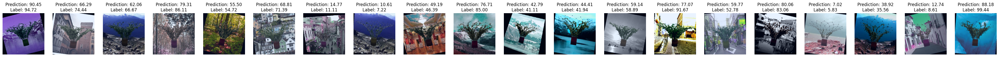

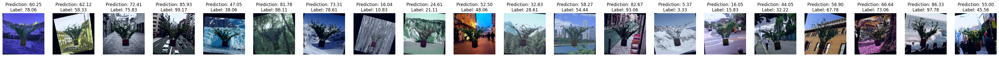

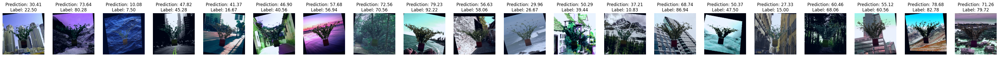

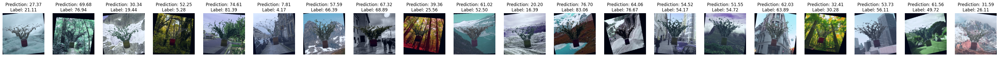

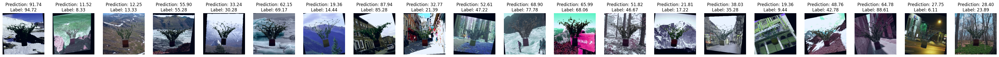

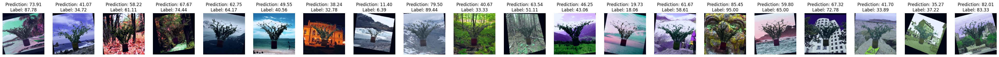

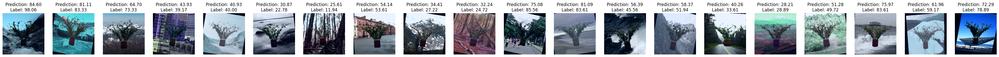

In [ ]:
# Plot validation images with predictions and labels
plot_images_with_predictions(model, val_loader)

# Test on real data

In [ ]:
# Import the model if needed
model = torch.load('model_trained.pth')

In [ ]:
!unzip test.zip

In [ ]:
# Define test_transform
test_transform = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet normalization
])

test_dataset = CustomDataset(root_dir='/content/test', transform=test_transform)

test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
# Function to plot images with predictions
def plot_images_with_predictions(model, test_loader, num_images=20):
    model.eval()
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            if i >= num_images:
                break
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            predictions = outputs.cpu().numpy().flatten()

            num_subplots = min(num_images, inputs.size(0))
            plt.figure(figsize=(40, 10))
            for j in range(num_subplots):
                # Normalize the image
                image = inputs[j].cpu().numpy().transpose((1, 2, 0))
                image = (image - image.min()) / (image.max() - image.min())  # Normalize pixel values
                prediction = predictions[j]/3.6

                plt.subplot(1, num_subplots, j+1)
                plt.imshow(image)
                plt.title(f'Prediction: {prediction:.2f}')
                plt.axis('off')
            plt.show()

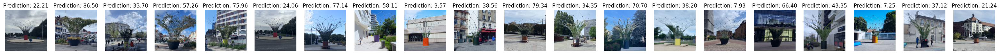

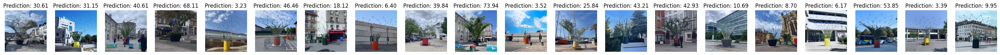

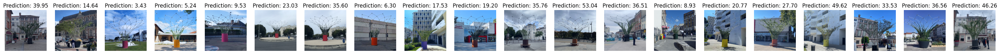

In [ ]:
# Plot test images with predictions and labels
plot_images_with_predictions(model, test_loader)

In [ ]:
# Function to plot a single image with its prediction, label, and filename
def plot_single_image_with_prediction(model, val_loader, index):
    model.eval()
    found = False
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(val_loader):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            predictions = outputs.cpu().numpy().flatten()

            for j in range(len(inputs)):
                if index == i * len(inputs) + j:
                    found = True
                    # Normalize the image
                    image = inputs[j].cpu().numpy().transpose((1, 2, 0))
                    image = (image - image.min()) / (image.max() - image.min())  # Normalize pixel values
                    label = targets[j].item() / 3.6
                    prediction = predictions[j] / 3.6
                    filename = val_loader.dataset.image_files[i * len(inputs) + j]  # Get filename

                    plt.figure(figsize=(5, 5))
                    plt.imshow(image)
                    plt.title(f'Filename: {filename}\nPrediction: {prediction:.2f}')
                    plt.axis('off')
                    plt.show()
                    break  # Stop after plotting the image
            if found:
                break  # Stop after finding and plotting the image
        if not found:
            print("Index out of range.")

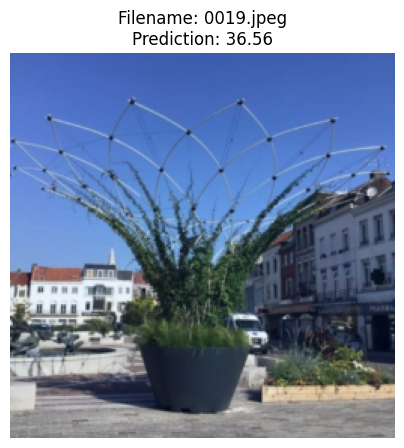

In [ ]:
# Plot test image with predictions and labels
plot_single_image_with_prediction(model, test_loader, 76)

In [ ]:
def rank_test_images_by_label(model, test_loader):
    model.eval()
    filenames = []
    labels = []
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            predictions = outputs.cpu().numpy().flatten()
            for i in range(len(predictions)):
                filenames.append(test_loader.dataset.image_files[i])  # Append image filename
                labels.append(predictions[i])  # Predicted label
    # Sort filenames based on predicted labels in descending order
    sorted_filenames = [x for _, x in sorted(zip(labels, filenames), reverse=True)]
    return sorted_filenames

In [ ]:
sorted_filenames = rank_test_images_by_label(model, test_loader)
print(sorted_filenames)

['0012.jpeg', '0007.jpeg', '0064.JPG', '0050.jpeg', '0065.JPG', '0010.jpeg', '0035.jpeg', '0059.jpeg', '0083.JPG', '0025.jpeg', '0072.jpg', '0051.JPG', '0075.jpg', '0020.jpeg', '0072.jpg', '0010.jpeg', '0047.jpeg', '0077.jpg', '0049.jpeg', '0067.jpg', '0013.jpeg', '0008.jpeg', '0071.jpg', '0006.jpeg', '0067.jpg', '0025.jpeg', '0079.jpg', '0018.png', '0091.jpeg', '0041.jpeg', '0027.jpeg', '0083.JPG', '0079.jpg', '0030.jpeg', '0030.jpeg', '0025.jpeg', '0007.jpeg', '0065.JPG', '0064.JPG', '0077.jpg', '0091.jpeg', '0047.jpeg', '0004.jpeg', '0013.jpeg', '0012.jpeg', '0075.jpg', '0041.jpeg', '0071.jpg', '0004.jpeg', '0075.jpg', '0051.JPG', '0018.png', '0077.jpg', '0071.jpg', '0059.jpeg', '0008.jpeg', '0008.jpeg', '0050.jpeg', '0041.jpeg', '0092.jpeg', '0049.jpeg', '0006.jpeg', '0015.jpeg', '0083.JPG', '0092.jpeg', '0065.JPG', '0027.jpeg', '0018.png', '0012.jpeg', '0029.jpeg', '0029.jpeg', '0015.jpeg', '0006.jpeg', '0035.jpeg', '0029.jpeg', '0079.jpg', '0051.JPG', '0092.jpeg', '0015.jpeg', '0